# Image artifier
### The goal of this project is to perform a high quality style transfer on images, where the style image is selected automatically from a large dataset of artwork - this makes for interesting experiments since I'm getting very varied and often unexpected matches.Once the style image is found I'm using style from patches that are the most similar to the content image to perform the transfer, this is different from the Gatys paper and inspired by the paper: [Deep Painterly Harmonization](https://arxiv.org/abs/1804.03189)


High level steps of the algorithm:
* Precompute vgg16 conv5_3 activations for 50 thousand images downloaded from [WikiArt.org](https://www.wikiart.org/). I'm serializing all the activations to files so I'm able to search through them in reasonable time.
* For a given content image I'm computing the conv5_1 activations. Then for each activation I'm considering it's neighbours to get 3x3 patches (with 512 stack channels).
* For each style image I compute cosine similarity across all the patches and select from the style the ones that are nearest to the content. The sum of these similarities is my measure of image similarities.
* The result of this process gives me a style image that doesn't necessarily look like the content image but can be stiched together into something that does.
* I rearange the patches according to their matching positions, upscale them to get the original style image pixel values and use that as the starting point for the training process.
* The loss function has three parts: content loss, style loss and total variation loss.
* The content loss is the usual L2 norm on activations. I'm using conv4_1 for that.
* For the style loss I again match the patches of activations, this time on the conv4_1 and then propagate the same matches down to the layers 3_1, 2_1 and 1_1 to use that to compute the Gram matrices. This is a simplified version of the second phase training from the "Deep Painterly Harmonization". The idea is to extract style only from the relevant portion of the image for a more harmonious effect. 
* The total variation loss adds a penalty for difference between neighbouring pixels to make the output a bit smoother.
* Finally I train it with Adam optimizer for 1000-2000 epochs

## Results
First column is the content image, second column is the style image found by the algorithm and the third one has the style transfer result.

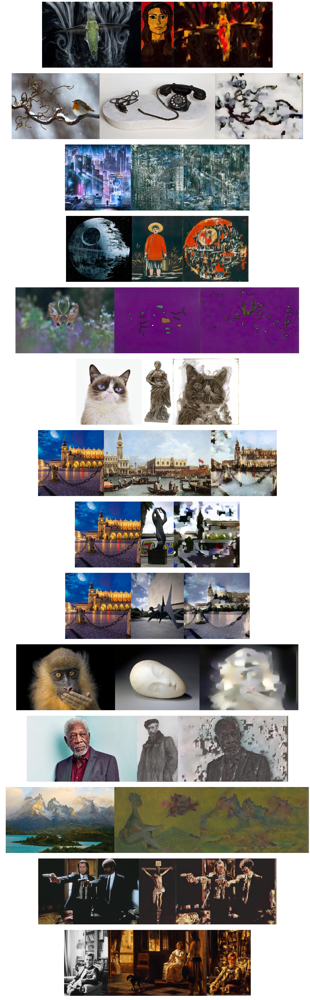

In [2]:
%matplotlib inline
import pathlib
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
all_files = sorted(list(pathlib.Path('results/stiched').glob('*.jpg')))
fig, axs = plt.subplots(len(all_files), 1, figsize=(50, 80))

for ax, fname in zip(axs, all_files):
    ax.imshow(Image.open(fname))
    ax.axis('off')
plt.tight_layout()

## Potential improvements
I've done a lot of experimentation, trial and error to get here, but still were many things I didn't get to try.
* Use [Histogram Loss](https://arxiv.org/pdf/1701.08893.pdf) this looks like it should fit right here and make for even better looking result.
* Pretrain the vgg on art. We are using a generic imagenet here, we could train it on the same wikiart dataset to make it better in understending art styles.
* Use an image detector to generate masks and have per mask gram matrices. I already try to keep the styles localized but still in the end styles from different parts can blend for unnatural results. Using something like r-cnn to segment the image first would be interesting.
* Faster searching for candidates. The similarity function I'm using is very expensive, doing N^2 comparisons across all activations (even though we do it in a single large matrix operation). There is probably some simpler heuristic that would work well enough.
* Consider rotations when matching style patches for better fitting pieces
* Image pre/post processing. I knew very little about working with images when I started this. There might be tricks to make it look better. The painterly harmonization paper talks about chrominance denoising but I didn't have time to learn what that is.
* Explore hiperparameters. Style transfer can be very sensitive to weights we use for all the losses. Currently I mostly use the same for all the images. Having a more robust way to adjust them would be great.

## Note on the performance
Generating the activations for the whole dataset took me several hours. I wanted to keep the images in a rather large resolution (I'm resizing smaller edge to 512 pixels) this made me run into both disk space and GPU memory problems. In the end I process 100 images at a time and save it to a ziped pickle file.

Matching patches between the images is another costly operation - I square a matrix with sizes like [30 * 30, 9 * 512]  that doesn't fit into memory so in the cosine similarity calculation I break it down into smaller batches. Luckily this is outside the training loop. Searching for a match takes me around 40sec per 1000 style images.

The optimization step itself isn't that slow and depends mostly on the content resolution. For 512x512 image it takes 3.5 minutes for 1000 epochs.

### All the helper functions

In [3]:
import torch
import torch.optim as optim
import torch.nn.functional as F
import torch.nn as nn
from torchvision import transforms, models, datasets
import matplotlib.pyplot as plt
import numpy as np
import pdb
from IPython import display
import math
import operator
from tqdm import tqdm_notebook
import gzip

In [4]:
# Function for visualizing images works on a tensor or list of tensors
def show_all(images, captions=[], title=None):
    img_n = len(images)
    cols = min(4, img_n)
    rows = (img_n + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(8 * cols,8 * rows))
    fig.suptitle(title)
    if len(images) > 1: axs = axs.flatten()
    else: axs = [axs]
    for idx, img in enumerate(images):
        ax = axs[idx]
        ax.imshow(tensor2img(img))
        ax.axis('off')
        if idx < len(captions):
            ax.set_title(captions[idx])

    plt.close()
    return fig

# Saves experiment result to a file, takes three tensors for content, style and the result
def save_result(name, images):
    suf = ['cont', 'style', 'res']
    for im,sf in zip(images, suf):
        fname = f'results/{name}_{sf}.jpg'
        plt.imsave(fname, tensor2img(im))

In [5]:
# Runs a tensor through all the vgg layers up to the given index
def get_activations(input, vgg_idx):
    net = nn.Sequential(*list(vgg.children())[:vgg_idx+1])
    return net(input)

In [6]:
# The losses
def style_loss(img, gram_tar):
    gram_img = gram_matrix(img)
    return matrix_diff(gram_img, gram_tar)

def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, -1).clone()
    gram = torch.mm(tensor, tensor.t())
    return gram / (h * w)

def tv_loss(X):
    return ((X[:,:-1,:] - X[:,1:,:]) ** 2).sum() + ((X[:,:,:-1] - X[:,:,1:]) ** 2).sum()

def content_loss(img, tar):
    return matrix_diff(img, tar)

def matrix_diff(m, m_tar):
    diff = (m - m_tar) ** 2
    return torch.mean(diff) * 10000 # Squaring small numbers gives very small numbers. Scaling it by a constant for readability and float precision

In [31]:
# training loop, backpropagates through pixel values of the image to minimize the sum or style, content and variation losses
def train(img_x, content_target, content_idx, style_targets, epochs = 500, content_mul=1e-5 ):
    img_x.requires_grad = True
    opt = optim.Adam([img_x], lr=0.01)
    style_idxs = list(style_targets.keys())
    last_layer = max(style_idxs + [content_idx])
    model_layers = list(vgg.children())[:last_layer+1]
    
    w_tv = 1e-9
    for st in range(epochs):
        style_lss = torch.tensor(0.0).cuda()
        content_lss = torch.tensor(0.0).cuda()
        x = img_x
        for idx, layer in enumerate(model_layers):
            x = layer(x)
            if idx == content_idx:
                content_lss +=  content_loss(x, content_target) * content_mul
            if idx in style_idxs:
                style_lss += style_loss(x, style_targets[idx])
        if st %50 == 49:
            display.clear_output(wait=True)
            display.display(show_all([img_x], [f'lss: {content_lss :.3f}, {style_lss :.3f}, {tv_lss :.3f}'], f'epoch {st}'))
        tv_lss = tv_loss(img_x) * w_tv
        lss = style_lss + content_lss + tv_lss
        opt.zero_grad()
        lss.backward()
        opt.step() 

In [8]:
# for each position in the layer concatenates its activations with the activations at the 8 surrounding postions
def add_neighbours(a):
    a = a.squeeze() # (chan, h, w)
    c,h, w = a.shape
    pada = F.pad(a, [1,1,1,1,0,0])
    b = torch.zeros(9,c,h,w, device = a.get_device())
    p=0
    for i in range(-1,2):
        for j in range(-1,2):
            b[p] = pada[:,1+i:h+1+i, 1+j:w+1+j]
            p+=1
    return b #(9,c, h, w)

# for each row in matrix X finds the most similar row in matrix Y, according to cosine similarity
def cosine_nearest(x, y): #h*w x 9*ch
    res = torch.empty([x.shape[0]], dtype=torch.int64).cuda()
    batch_size = 500
    total_dist =0
    for idx in range(0, len(res), batch_size):
        batch_end = min(len(res), idx + batch_size)
        batch = slice(idx, batch_end)
        bx = x[batch,:]
        res[batch],dist = cosine_batch(bx,y)
        total_dist += dist
    return res, total_dist

def cosine_batch(x, y):
    scals = torch.mm(x, y.t())
    x_norm = torch.sqrt(x**2).sum(1).view(-1, 1)
    y_norm = torch.sqrt(y**2).sum(1).view(1, -1)
    xy = torch.mm(x, y.t())
    dist = scals / (1e-8 + x_norm * y_norm)
    maxs, max_idxs = dist.max(dim=1)
    return max_idxs, maxs.sum()

# stiches an image from indices selected from a vgg layer maxpooled mult times
def reconstruct(style, min_idxs, mult, ch, cw, sh, sw):
    upscaled = torch.empty_like(content)
    lxs, lys = torch.meshgrid([torch.arange(0,ch, dtype=torch.int64), torch.arange(0,cw, dtype=torch.int64)])
    lxs = lxs.contiguous().view(-1)
    lys = lys.contiguous().view(-1)
    rxs, rys = torch.meshgrid([torch.arange(0,sh, dtype=torch.int64), torch.arange(0,sw, dtype=torch.int64)])
    rxs = rxs.contiguous().view(-1)
    rys = rys.contiguous().view(-1)
    
    rxs = rxs[min_idxs]
    rys = rys[min_idxs]
    for i in range(mult):
        for j in range(mult):
            upscaled[:,:,lxs * mult + i,lys * mult + j] = style[:, :, mult * rxs + i, mult * rys + j]
    return upscaled

# finds a mapping of nearest patches between the content and style activations
def get_nearest_idxs(content_act, style_act):
    _, chan, ch, cw = content_act.shape
    _, chan, sh, sw = style_act.shape
    img_neighb,style_neighb = content_act, style_act

    A = img_neighb.view(-1, ch*cw ).t()  # (h * w, 9 * chan)
    B = style_neighb.view(-1, sh*sw).t()
    max_idxs, dist = cosine_nearest(A,B) #h*w
    return max_idxs, dist

# First maps style into content based on the activations and then uses that to reconstruct matching pixels.
def get_nearest_style(content_act, style_act, style_img):  #(1, chan, h, w)
    _, chan, sh, sw = style_act.shape
    _, chan, ch, cw = content_act.shape
    min_idxs,_ = get_nearest_idxs(content_act, style_act)
    targets = style_act.view(chan, sh*sw)[:,min_idxs]
    targets = targets.view(1,chan,ch,cw)
    dist = torch.sum((content_act-targets)**2)
    mult = style.shape[2] //style_act.shape[2]
    upscaled = reconstruct(style_img, min_idxs, mult, ch, cw, sh, sw)
    return upscaled, targets, dist

In [9]:
# searches through serialized activations in a given range to find a best matching image
def find_best_match(content_nei, from_idx, to_idx):
    best_idx=None
    best = 0
    activations = None
    for i in tqdm_notebook(range(from_idx,to_idx)):
        if activations is None or i % file_batch == 0:
            fname = f'precomp_act/act{(i // file_batch) * file_batch}.gz'
            with gzip.open(fname, 'rb') as f:
                activations = torch.load(f)
                #print("loading", fname)
        style_act = activations[i % file_batch] 
        style_nei = add_neighbours(style_act)
        idxs,dist =  get_nearest_idxs(content_nei, style_nei)
        if(dist>best):
            best = dist
            best_idx = i
    return best_idx  

In [10]:
#Helper functions for loading images, converting them to tensors and back
normalize_params = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
def img2tensor(image, size = None):
    tfms = [
            transforms.ToTensor(),
            transforms.Normalize(*normalize_params)]
    if size is not None:
        tfms.insert(0, transforms.Resize(size))
    image = transforms.Compose(tfms)(image)  
    return image[None].type(torch.FloatTensor).cuda()

def tensor2img(tensor):
    image = tensor.data.cpu().squeeze().numpy()
    image = image.transpose(1,2,0)
    image = image * np.array(normalize_params[1]) + np.array(normalize_params[0])
    image = image.clip(0, 1)

    return image

def load_image(img_path, max_size=512):
    image = Image.open(img_path).convert('RGB')
    image = img2tensor(image, max_size)
    # discard the transparent, alpha channel 
    image = image[:,:3,:,:]
    return image

In [11]:
# for a set of indices in a layer, computes the set of corresponing indices before the MaxPool2d(2,2)
def upscale_idx(idxs, cur_h, cur_w):
    new_h = cur_h * 2
    new_w = cur_w * 2
    idxs_x = idxs / cur_w
    idxs_y = idxs % cur_w
    new_x = idxs_x * 2
    new_y = idxs_y * 2
    all_x = torch.stack([new_x, new_x+1, new_x, new_x+1] ).view(-1)
    all_y = torch.stack([new_y, new_y, new_y+1, new_y+1] ).view(-1)
    return all_x * new_w + all_y

### We are using pretrained VGG16 network with batchnorm in addition to conv and relu layers

In [12]:
vgg = models.vgg16_bn(pretrained=True).features.cuda().eval()
# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

In [13]:
# Index all the layers with strings for convinience
l_idx =1 
l_d = 1
layer_id2idx ={}
for idx, layer in enumerate(vgg.children()):
    layer_id = f'{l_d}_{l_idx}'
    layer_id2idx[layer_id] = idx
    print(layer_id + ':', layer)
    if isinstance(layer, nn.MaxPool2d):
        l_d +=1
        l_idx = 1
    else:
        l_idx +=1

1_1: Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_2: BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
1_3: ReLU(inplace)
1_4: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_5: BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
1_6: ReLU(inplace)
1_7: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
2_1: Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_2: BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
2_3: ReLU(inplace)
2_4: Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_5: BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
2_6: ReLU(inplace)
2_7: MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
3_1: Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_2: BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, tra

In [14]:
net53 = nn.Sequential(*list(vgg.children())[:layer_id2idx['5_3']+1])

### Loading the dataset

In [18]:
# wget http://www.cs-chan.com/source/ICIP2017/wikiart.zip - it's 27 gigs of art images 
wikiart = Path('wikiart')
# kept 10 styles not to run out of disk space
for art_style in wikiart.iterdir():
    print(art_style, len(list(art_style.iterdir())))

wikiart/Impressionism 12276
wikiart/Romanticism 6654
wikiart/Cubism 2181
wikiart/Pop_Art 1471
wikiart/Minimalism 1332
wikiart/Expressionism 6561
wikiart/Baroque 4032
wikiart/Naive_Art_Primitivism 2301
wikiart/Realism 10425
wikiart/Abstract_Expressionism 2767


In [19]:
data_transforms = transforms.Compose([transforms.Resize(512),transforms.ToTensor(), transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
dataset = datasets.ImageFolder(wikiart, transform=data_transforms)
file_batch = 100 #size of file with precomputed activationsi
len(dataset)

50000

### Precomputing activations, don't run it unless you have a lot of time and disk space

In [138]:
%%time
activations = []
for idx in tqdm_notebook(range(0,len(dataset))):
    x,_ = dataset[idx]
    act = net53(x[None].cuda())
    activations.append(act)
    if idx % file_batch == file_batch-1:
        with gzip.open(f'precomp_act/act{file_batch*(idx//file_batch)}.gz', 'wb') as f:
            torch.save(activations,f)
        # purge from CUDA memory after it's saved to file
        del activations
        torch.cuda.empty_cache()
        activations=[]

CPU times: user 57min 57s, sys: 3min 35s, total: 1h 1min 33s
Wall time: 1h 6min 17s


### The wikiart dataset has different style categories:

In [20]:
styles = [Path(samp).parts[1] for samp,_ in dataset.samples]

style_start={}
style_end={}

for idx, style in enumerate(styles):
    if style not in style_start:
        style_start[style] = idx
    style_end[style]=idx

style_start

{'Abstract_Expressionism': 0,
 'Baroque': 2767,
 'Cubism': 6799,
 'Expressionism': 8980,
 'Impressionism': 15541,
 'Minimalism': 27817,
 'Naive_Art_Primitivism': 29149,
 'Pop_Art': 31450,
 'Realism': 32921,
 'Romanticism': 43346}

### The content image

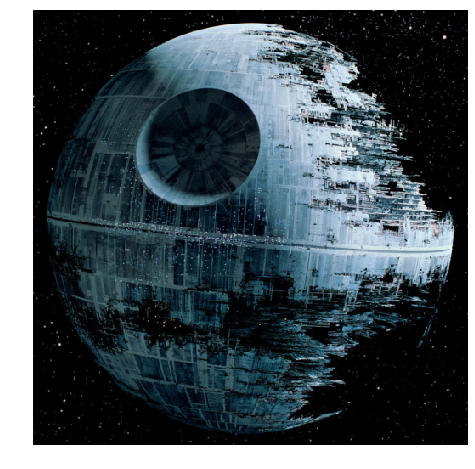

In [21]:
content=load_image('images/deathstar.jpg')
show_all(content)

### Searching through all the images of the given category

If you'd rather just use your own style picture run the cell bellow and skip the rest of this section

In [22]:
style_name = 'Naive_Art_Primitivism'

content_act = net53(content)
content_nei = add_neighbours(content_act)
match_idx = find_best_match(content_nei, style_start[style_name], style_end[style_name] + 1)
print(match_idx)


31014


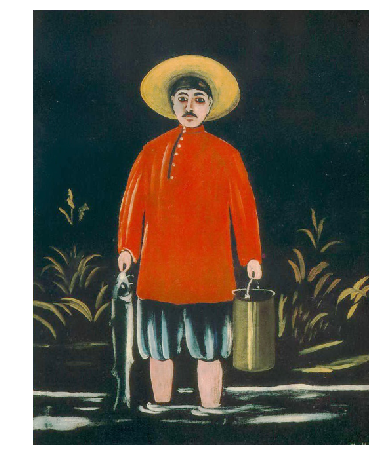

In [23]:
style = dataset[match_idx][0][None].cuda()
show_all(style)

### Deconstructing the style image and patching it into something that looks like the content

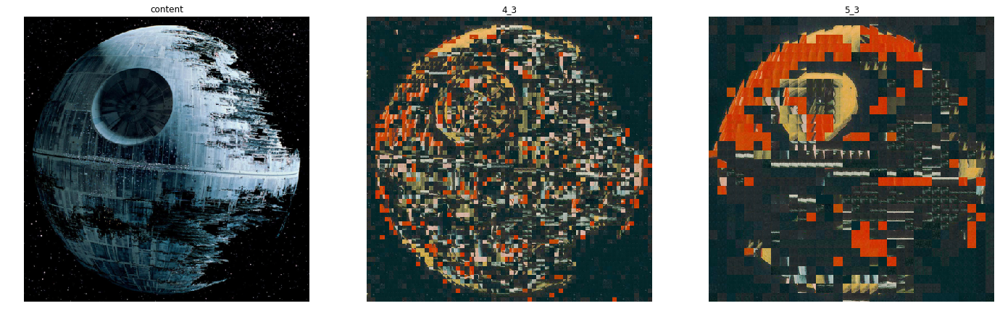

In [24]:
style_layers = ['4_3','5_3']
imgs = []
for layer in style_layers:
    l_idx = layer_id2idx[layer]
    content_act = get_activations(content, l_idx)
    style_act = get_activations(style, l_idx)
    img, target,_ = get_nearest_style(content_act, style_act, style)
    imgs.append(img)
show_all([content] + imgs, captions = ['content'] + style_layers)

### Average or the reconstructed style images

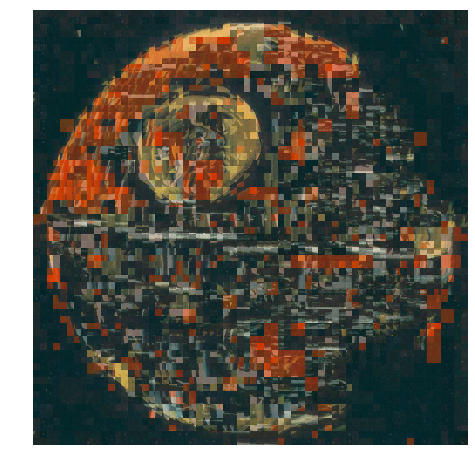

In [42]:
img_x = torch.stack(imgs).sum(dim=0)/(len(imgs))
show_all(img_x)

In [43]:
ref_layer = '4_3' # layer from which we select indices to use for the style loss
content_idx =layer_id2idx[ref_layer]
content_target = get_activations(content, content_idx)
style_act = get_activations(style, layer_id2idx[ref_layer])
min_idxs, _ = get_nearest_idxs(content_act, style_act)
style_targets={}

In [44]:
uniq_idxs = torch.unique(min_idxs) # we use a single copy of each activation vector for Gram matrices
target_activ = style_act.view(style_act.shape[1],-1)[:,uniq_idxs]
style_targets[layer_id2idx[ref_layer]] = torch.mm(target_activ, target_activ.t()) / target_activ.shape[1]

In [45]:
cur_h, cur_w = style_act.shape[2:]
for layer in ['3_3', '2_3','1_3']:
    layer_id = layer_id2idx[layer]
    style_act = get_activations(style, layer_id)
    uniq_idxs = upscale_idx(uniq_idxs, cur_h,cur_w)
    target_activ = style_act.view(style_act.shape[1],-1)[:,uniq_idxs]
    style_targets[layer_id] = torch.mm(target_activ, target_activ.t()) / target_activ.shape[1]
    cur_h, cur_w = cur_h * 2, cur_w * 2

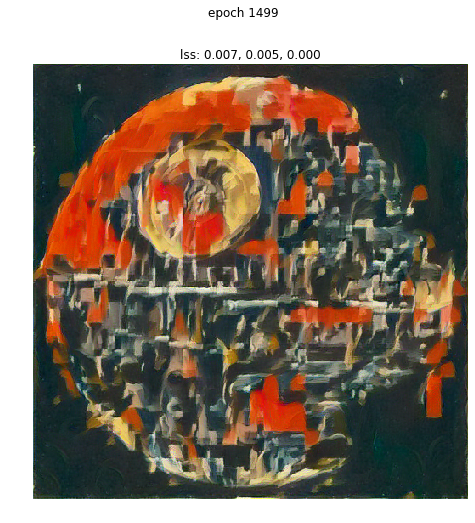

CPU times: user 3min 34s, sys: 1min 23s, total: 4min 58s
Wall time: 4min 59s


In [46]:
%%time 
train(img_x,content_target, content_idx, style_targets, epochs = 1500, content_mul = 1e-4)

# Result

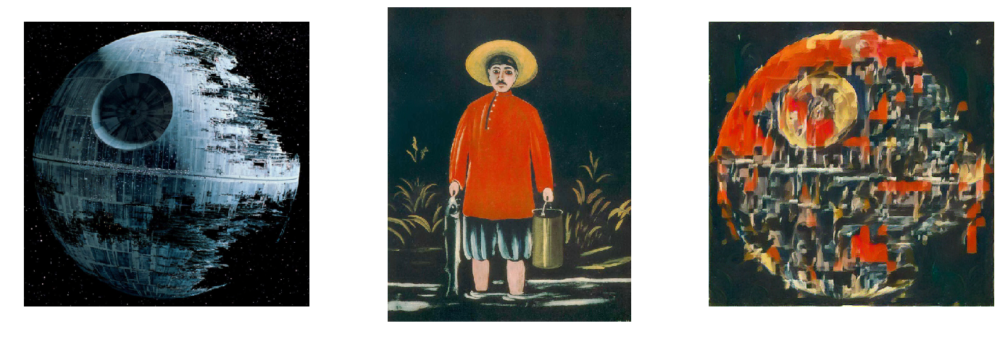

In [47]:
show_all([content,style,img_x])
save_result('deathstar',[content,style,img_x])
